In [1]:
# Configuration:
## Set the WANDB entity and project name to be used
# TODO: Set to more generic username for Wandb
wandb_entity_project = "cleanrl/ppo-kle"

In [2]:
# Dependencies
import os, re
import math
import copy
import wandb
import pickle
import numpy as np
import pandas as pd
from os import path

# Plot libraries
import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
sns.set(style="white")

In [3]:
# Loading the data for the bar plots
api = wandb.Api()

last_n_steps_for_average = 0
runs = api.runs(wandb_entity_project)

summary_list = []
config_list = []
name_list = []

for run in runs:
    if last_n_steps_for_average:
        last_n_steps_average_reward = pd.DataFrame(
        run.scan_history(
            min_step=run.lastHistoryStep-last_n_steps_for_average
        ))["charts/episode_reward"].mean()
        run.summary._json_dict["charts/episode_reward"] = last_n_steps_average_reward

    summary_list.append(run.summary._json_dict)

    # run.config is the input metrics.
    # We remove special values that start with _.
    config = {k:v for k,v in run.config.items() if not k.startswith('_')}
    config_list.append(config)
    # run.name is the name of the run.
    name_list.append(run.name)

summary_df = pd.DataFrame.from_records(summary_list)
config_df = pd.DataFrame.from_records(config_list)
name_df = pd.DataFrame({'name': name_list})

## Impportant, otherwise will be overwritten when loading other dataframes downstream
ALL_DF_EPOCHS_K = pd.concat([name_df, config_df,summary_df], axis=1)

# NER By Environemnt by EXP NAME BY EPOCHS
ALL_ENVS_EXP_K_RESULTS = {}

def get_env_exp_normreturns_df(env_name):
    tmp_env_df = pd.DataFrame()
    # Get max return across all the exp runs againt the specified env_name
    max_reward = ALL_DF_EPOCHS_K.loc[(ALL_DF_EPOCHS_K['gym_id'] == env_name)]["charts/episode_reward"].max()
    
    # Get min return across all the exp runs againt the specified env_name
    min_reward = ALL_DF_EPOCHS_K.loc[(ALL_DF_EPOCHS_K['gym_id'] == env_name)]["charts/episode_reward"].min()
    
    # Iterate over all experiments to get their normalized means
    for exp_name in ALL_EXP_NAMES:
        exp = ALL_DF_EPOCHS_K.loc[
            (ALL_DF_EPOCHS_K['gym_id'] == env_name) &
            (ALL_DF_EPOCHS_K['exp_name'] == exp_name)
        ].groupby("update_epochs").mean()["charts/episode_reward"]
        
        exp.name = exp_name
        
        tmp_env_df = tmp_env_df.append(
            (exp-min_reward)/(max_reward-min_reward)
        )
    
    return tmp_env_df

# List of all environments available, better left untouched
ALL_ENVS = list(sorted(set(ALL_DF_EPOCHS_K["gym_id"])))
ALL_EXP_NAMES = list(sorted(set(ALL_DF_EPOCHS_K["exp_name"])))

# Labels for all experiments
ALL_EXP_LABELS = dict()

for exp_name in ALL_EXP_NAMES:
    exp_label = "PPO"
    
    if "kle-rollback" in exp_name:
        exp_label += " w/ KLE-Rollback"
        
        # Recovering the d_targer from exp name
        regex = re.compile('[a-zA-Z]')
        d_target = regex.sub('', exp_name)
        regex = re.compile('-') # Removes hyphens
        d_target = regex.sub('', d_target)
        
        exp_label += " (%s)" % d_target
        
    elif "kle-stop" in exp_name:
        exp_label += " w/ KLE-Stop"
        
        # Recovering the d_targer from exp name
        regex = re.compile('[a-zA-Z]')
        d_target = regex.sub('', exp_name)
        regex = re.compile('-') # Removes hyphens
        d_target = regex.sub('', d_target)
        
        exp_label += " (%s)" % d_target
    
    ALL_EXP_LABELS[exp_name] = exp_label

# Collect all the results in a dictionary so we can address each environment's by the environment name itself.
for env_name in ALL_ENVS:
    ALL_ENVS_EXP_K_RESULTS[env_name] = get_env_exp_normreturns_df(env_name)

In [4]:
# Loading or persisiting data for Average Episode Reward, Number of Update Iteration and Approximate KL Divergence
FEATURES_OF_INTEREST = ['charts/episode_reward', "losses/approx_kl", "debug/pg_stop_iter"]

# Global variables for the plot data. Will be used down stream.
ALL_ENVS_DATA_BY_FEATURES = dict()
ALL_ALLDF_BY_FEATURES = dict()

# Cache directory for the current project
wandb_entity_project_dir = wandb_entity_project.replace("/","_").replace("-", "_").replace(".","_")

if not os.path.exists(wandb_entity_project_dir):
    os.makedirs(wandb_entity_project_dir)

for feature_of_interest in FEATURES_OF_INTEREST:
    # Feature name for file caching
    feature_dirname = feature_of_interest.replace("/", "_")
    feature_dirname = wandb_entity_project_dir + "/" + feature_dirname
    
    if not os.path.exists(feature_dirname):
        os.makedirs(feature_dirname)

    # Checking that both files exist, otherwise load the data and preprocess, then save it
    if not path.exists(f"{feature_dirname}/envs_cache.pkl") or not path.exists(f"{feature_dirname}/all_df_cache.pkl"):
        runs = api.runs(wandb_entity_project)
        summary_list = [] 
        config_list = [] 
        name_list = []
        envs = {}
        data = []
        rolling_average = 10
        sample_points = 500

        for idx, run in enumerate(runs):
            if feature_of_interest in run.summary:
                ls = run.history(keys=[feature_of_interest, 'global_step'], pandas=False)
                metrics_dataframe = pd.DataFrame(ls[0])
                metrics_dataframe.insert(len(metrics_dataframe.columns), "algo", run.config['exp_name'] + "-" + str(run.config['update_epochs']))
                metrics_dataframe.insert(len(metrics_dataframe.columns), "seed", run.config['seed'])
    
                data += [metrics_dataframe]
                if run.config["gym_id"] not in envs:
                    envs[run.config["gym_id"]] = [metrics_dataframe]
                    envs[run.config["gym_id"]+"total_timesteps"] = run.config["total_timesteps"]
                else:
                    envs[run.config["gym_id"]] += [metrics_dataframe]

                summary_list.append(run.summary._json_dict) 
                config_list.append({k:v for k,v in run.config.items() if not k.startswith('_')}) 

                name_list.append(run.name)       


        summary_df = pd.DataFrame.from_records(summary_list) 
        config_df = pd.DataFrame.from_records(config_list) 
        name_df = pd.DataFrame({'name': name_list}) 
        
        all_df = pd.concat([name_df, config_df,summary_df], axis=1)
        data = pd.concat(data, ignore_index=True)

        # Smoothing
        rolling_average = 20
        for env in envs:
            if not env.endswith("total_timesteps"):
                for idx, metrics_dataframe in enumerate(envs[env]):
                    envs[env][idx] = metrics_dataframe.dropna(subset=[feature_of_interest])
                    envs[env][idx][feature_of_interest] = metrics_dataframe[feature_of_interest].rolling(rolling_average).mean()[rolling_average:]

        with open(f'{feature_dirname}/all_df_cache.pkl', 'wb') as handle:
            pickle.dump(all_df, handle, protocol=pickle.HIGHEST_PROTOCOL)
        with open(f'{feature_dirname}/envs_cache.pkl', 'wb') as handle:
            pickle.dump(envs, handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        with open(f'{feature_dirname}/all_df_cache.pkl', 'rb') as handle:
            all_df = pickle.load(handle)
        with open(f'{feature_dirname}/envs_cache.pkl', 'rb') as handle:
            envs = pickle.load(handle)
    
    ALL_ENVS_DATA_BY_FEATURES[feature_of_interest] = envs # Also used further
    ALL_ALLDF_BY_FEATURES[feature_of_interest] = all_df # This is used further
    
    print("ALL_ENVS and ALL_ALLDF loaded for feature: %s"  %feature_of_interest)

print("# DONE")

ALL_ENVS and ALL_ALLDF loaded for feature: charts/episode_reward
ALL_ENVS and ALL_ALLDF loaded for feature: losses/approx_kl
ALL_ENVS and ALL_ALLDF loaded for feature: debug/pg_stop_iter
# DONE


In [5]:
## Cache results of get_df_for_env_by_feature_of_interest() for each env and each feature of interest for even faster plots
## This is the most time consuming part.
    
## First, the helper:
## That gets the dataframe for each env - feature of interest pair
def get_df_for_env_by_feature_of_interest(gym_id, feature_of_interest):
    # Loaded the concerned data wrt feature of interest
    tmp_envs = ALL_ENVS_DATA_BY_FEATURES[feature_of_interest]

    # The rest of the logic stays unchanged (?)
    env_total_timesteps = tmp_envs[gym_id+"total_timesteps"]
    env_increment = env_total_timesteps / 500
    envs_same_x_axis = []
    for sampled_run in tmp_envs[gym_id]:
        df = pd.DataFrame(columns=sampled_run.columns)
        x_axis = [i*env_increment for i in range(500-2)]
        current_row = 0
        for timestep in x_axis:
            while sampled_run.iloc[current_row]["global_step"] < timestep:
                current_row += 1
                if current_row > len(sampled_run)-2:
                    break
            if current_row > len(sampled_run)-2:
                break
            temp_row = sampled_run.iloc[current_row].copy()
            temp_row["global_step"] = timestep
            df = df.append(temp_row)

        envs_same_x_axis += [df]
    return pd.concat(envs_same_x_axis, ignore_index=True)

# Loadings the dataframes for Average Episode Reward, Number of Update Iteration and Approximate KL Divergence
ALL_ENV_EP_REWARD_DATA = {}
ALL_ENV_APPROX_KL_DATA = {}
ALL_ENV_PG_STOP_ITER_DATA = {}

for env_name in ALL_ENVS:
    ### Average Episode Reward ###
    feature_dirname = "charts/episode_reward".replace("/", "_")
    feature_dirname = wandb_entity_project_dir + "/" + feature_dirname
    
    cache_filename = "ep_reward_data_%s_cache.pkl"%env_name
    cache_filename = feature_dirname + "/" + cache_filename
    
    print( "# Preloading Ep Reward %s's data", env_name)
    if not path.exists(f"{cache_filename}"):
        ALL_ENV_EP_REWARD_DATA[env_name] = get_df_for_env_by_feature_of_interest(env_name, "charts/episode_reward")
        
        with open(f'{cache_filename}', 'wb') as handle:
            pickle.dump(ALL_ENV_EP_REWARD_DATA[env_name], handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        with open(f'{cache_filename}', 'rb') as handle:
            ALL_ENV_EP_REWARD_DATA[env_name] = pickle.load(handle)

    ### Approx KL ###
    feature_dirname = "losses/approx_kl".replace("/", "_")
    feature_dirname = wandb_entity_project_dir + "/" + feature_dirname
    
    cache_filename = "approx_kl_data_%s_cache.pkl"%env_name
    cache_filename = feature_dirname + "/" + cache_filename
    
    print( "# Preloading Approx KL %s's data", env_name)
    if not path.exists(f"{cache_filename}"):
        ALL_ENV_APPROX_KL_DATA[env_name] = get_df_for_env_by_feature_of_interest(env_name, "losses/approx_kl")
        
        with open(f'{cache_filename}', 'wb') as handle:
            pickle.dump(ALL_ENV_APPROX_KL_DATA[env_name], handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        with open(f'{cache_filename}', 'rb') as handle:
            ALL_ENV_APPROX_KL_DATA[env_name] = pickle.load(handle)
    
    
    ### Number of Update Iteration ###
    feature_dirname = "debug/pg_stop_iter".replace("/", "_")
    feature_dirname = wandb_entity_project_dir + "/" + feature_dirname
    
    cache_filename = "pg_stop_iter_data_%s_cache.pkl"%env_name
    cache_filename = feature_dirname + "/" + cache_filename
    
    print( "# Preloading PgStorIter KL %s's data", env_name)
    if not path.exists(f"{cache_filename}"):
        ALL_ENV_PG_STOP_ITER_DATA[env_name] = get_df_for_env_by_feature_of_interest(env_name, "debug/pg_stop_iter")
        
        ## Adding data corresponding to PPO with various K
        for item in [10, 40, 80]:
            tmp_all_envs = ALL_ENVS_DATA_BY_FEATURES["debug/pg_stop_iter"]
            fake_df = pd.DataFrame(columns=tmp_all_envs[env_name][0].columns)
            env_total_timesteps = tmp_all_envs[env_name+"total_timesteps"]
            env_increment = env_total_timesteps / 500
            fake_df["global_step"] = [i*env_increment for i in range(rolling_average,500-2)]
            fake_df["algo"] = f"m-aggr-{item}" 
            fake_df["debug/pg_stop_iter"] = item

            ALL_ENV_PG_STOP_ITER_DATA[env_name] = pd.concat([ALL_ENV_PG_STOP_ITER_DATA[env_name], fake_df], ignore_index=True)

            with open(f'{cache_filename}', 'wb') as handle:
                pickle.dump(ALL_ENV_PG_STOP_ITER_DATA[env_name], handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        with open(f'{cache_filename}', 'rb') as handle:
            ALL_ENV_PG_STOP_ITER_DATA[env_name] = pickle.load(handle)
    
    print( "------")

print( "All done")

# Preloading Ep Reward %s's data Ant-v2
# Preloading Approx KL %s's data Ant-v2
# Preloading PgStorIter KL %s's data Ant-v2
------
# Preloading Ep Reward %s's data HalfCheetah-v2
# Preloading Approx KL %s's data HalfCheetah-v2
# Preloading PgStorIter KL %s's data HalfCheetah-v2
------
# Preloading Ep Reward %s's data Hopper-v2
# Preloading Approx KL %s's data Hopper-v2
# Preloading PgStorIter KL %s's data Hopper-v2
------
# Preloading Ep Reward %s's data Humanoid-v2
# Preloading Approx KL %s's data Humanoid-v2
# Preloading PgStorIter KL %s's data Humanoid-v2
------
# Preloading Ep Reward %s's data InvertedPendulum-v2
# Preloading Approx KL %s's data InvertedPendulum-v2
# Preloading PgStorIter KL %s's data InvertedPendulum-v2
------
# Preloading Ep Reward %s's data Pusher-v2
# Preloading Approx KL %s's data Pusher-v2
# Preloading PgStorIter KL %s's data Pusher-v2
------
# Preloading Ep Reward %s's data Reacher-v2
# Preloading Approx KL %s's data Reacher-v2
# Preloading PgStorIter KL %s'

In [6]:
# Table 1: Normalized Average Returns

## Function that create the dataframe of the Normalized Episode Reward for a given experiment
def get_normalized_reward_df(exp_name):
    exp_df = pd.DataFrame()
    for env in ALL_ENVS:
        max_reward = ALL_DF_EPOCHS_K.loc[
            (ALL_DF_EPOCHS_K['gym_id'] == env)
        ]["charts/episode_reward"].max()
        min_reward = ALL_DF_EPOCHS_K.loc[
            (ALL_DF_EPOCHS_K['gym_id'] == env)
        ]["charts/episode_reward"].min()
        exp = ALL_DF_EPOCHS_K.loc[
            (ALL_DF_EPOCHS_K['gym_id'] == env) &
            (ALL_DF_EPOCHS_K['exp_name'] == exp_name)
        ].groupby("update_epochs").mean()["charts/episode_reward"]
        exp.name = env
        exp_df = exp_df.append(
            (exp-min_reward)/(max_reward-min_reward)
        )
    return exp_df

# Generating the data for the bar plots / broken line plots.
exp_dfs = [get_normalized_reward_df(exp_name) for exp_name in ALL_EXP_NAMES]

results = []
for idx, item in enumerate(ALL_EXP_NAMES):
    result = exp_dfs[idx].mean(0)
    result.name = ALL_EXP_LABELS[item]
    results += [result]

epochs_result = pd.DataFrame(results)

print("########## \nNormalized Episode Reward by Experiment and Update Epochs ##########")
print(epochs_result)

########## 
Normalized Episode Reward by Experiment and Update Epochs ##########
                                   4         10        20        40        80
PPO                          0.543863  0.659249  0.523608  0.344934  0.316869
PPO w/ KLE-Rollback (0.015)  0.531279  0.432014  0.585779  0.523181  0.575380
PPO w/ KLE-Rollback (0.02)   0.507173  0.622143  0.571003  0.656451  0.572623
PPO w/ KLE-Rollback (0.025)  0.606477  0.520352  0.606021  0.609478  0.726591
PPO w/ KLE-Rollback (0.03)   0.591653  0.701717  0.723361  0.677659  0.695760
PPO w/ KLE-Rollback (0.05)   0.667735  0.701202  0.677632  0.664586  0.708011
PPO w/ KLE-Stop (0.015)      0.616701  0.614850  0.604851  0.610583  0.597661
PPO w/ KLE-Stop (0.02)       0.612984  0.627945  0.689455  0.708300  0.664848
PPO w/ KLE-Stop (0.025)      0.648132  0.733599  0.683671  0.641663  0.721813
PPO w/ KLE-Stop (0.03)       0.676279  0.721914  0.653845  0.777348  0.673818
PPO w/ KLE-Stop (0.05)       0.626851  0.699294  0.822271  0.

In [16]:
# Table 2: Average number of update iteration wihen using either of the KLE variant.
EXP_NAMES_WITHOUT_BASELINE_PPO = ALL_EXP_NAMES.copy()
EXP_NAMES_WITHOUT_BASELINE_PPO.remove("m-aggr")
EXP_NAMES_WITHOUT_BASELINE_PPO

Ks = [4, 10, 20, 40, 80]
MEAN_PG_STOP_ITER_DF = pd.DataFrame(columns=Ks, index=[ALL_EXP_LABELS[exp_name] for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO])

for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO:
    for K in Ks:
        exp_name_K = f"{exp_name}-{K}"
        mean_pg_stop_iter = np.mean([ ALL_ENV_PG_STOP_ITER_DATA[env_name].loc[(ALL_ENV_PG_STOP_ITER_DATA[env_name]['algo'] == exp_name_K)].mean()["debug/pg_stop_iter"] + 1 for env_name in ALL_ENVS])
        MEAN_PG_STOP_ITER_DF.loc[ALL_EXP_LABELS[exp_name]][K] = mean_pg_stop_iter

# Note: can also do it environment wise.
MEAN_PG_STOP_ITER_DF # Displays the dataframe nicer than print in Jupyter Notebooks.
# print(MEAN_PG_STOP_ITER_DF.to_latex()) # Generates the latex code for the table in the paper

,4,10,20,40,80
PPO w/ KLE-Rollback (0.015),2.94394,3.97476,4.37465,4.58632,4.57248
PPO w/ KLE-Rollback (0.02),3.20433,4.80711,5.63569,6.14937,6.42009
PPO w/ KLE-Rollback (0.025),3.42055,5.59462,6.89266,7.86532,8.62837
PPO w/ KLE-Rollback (0.03),3.62458,6.19265,8.08006,9.58869,10.5325
PPO w/ KLE-Rollback (0.05),3.92269,8.29211,11.8261,15.4575,18.0971
PPO w/ KLE-Stop (0.015),2.85053,3.77295,4.14556,4.43997,4.51596
PPO w/ KLE-Stop (0.02),3.14641,4.59067,5.37008,5.79903,6.18421
PPO w/ KLE-Stop (0.025),3.38499,5.4073,6.58063,7.63661,8.54096
PPO w/ KLE-Stop (0.03),3.5847,6.063,7.79963,9.24519,10.5656
PPO w/ KLE-Stop (0.05),3.91528,8.13171,11.4849,14.8988,16.8698


In [13]:
# Table ?: Std of number of update iteration wihen using either of the KLE variant.
EXP_NAMES_WITHOUT_BASELINE_PPO = ALL_EXP_NAMES.copy()
EXP_NAMES_WITHOUT_BASELINE_PPO.remove("m-aggr")
EXP_NAMES_WITHOUT_BASELINE_PPO

Ks = [4, 10, 20, 40, 80]
VAR_PG_STOP_ITER_DF = pd.DataFrame(columns=Ks, index=[ALL_EXP_LABELS[exp_name] for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO])

for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO:
    for K in Ks:
        exp_name_K = f"{exp_name}-{K}"
        var_pg_stop_iter = np.mean([ ALL_ENV_PG_STOP_ITER_DATA[env_name].loc[(ALL_ENV_PG_STOP_ITER_DATA[env_name]['algo'] == exp_name_K)].std()["debug/pg_stop_iter"] +1 for env_name in ALL_ENVS])
        VAR_PG_STOP_ITER_DF.loc[ALL_EXP_LABELS[exp_name]][K] = var_pg_stop_iter

# Note: can also do it environment wise.
VAR_PG_STOP_ITER_DF # Displays the dataframe nicer than print in Jupyter Notebooks.
# print(MEAN_PG_STOP_ITER_DF.to_latex()) # Generates the latex code for the table in the paper

,4,10,20,40,80
PPO w/ KLE-Rollback (0.015),1.47036,2.32647,2.93394,3.22901,3.36683
PPO w/ KLE-Rollback (0.02),1.40179,2.33166,3.29977,3.96507,4.47431
PPO w/ KLE-Rollback (0.025),1.3339,2.40653,3.55128,4.648,5.80503
PPO w/ KLE-Rollback (0.03),1.24938,2.44749,3.72182,5.10019,6.81835
PPO w/ KLE-Rollback (0.05),1.09267,2.00628,4.20792,7.16384,11.1267
PPO w/ KLE-Stop (0.015),1.48954,2.31645,2.882,3.12043,3.44149
PPO w/ KLE-Stop (0.02),1.43057,2.35252,3.24152,3.70522,4.48426
PPO w/ KLE-Stop (0.025),1.34262,2.41871,3.54723,4.73009,6.08772
PPO w/ KLE-Stop (0.03),1.2732,2.41817,3.82399,5.15575,6.77685
PPO w/ KLE-Stop (0.05),1.0967,2.06486,4.40044,7.5188,11.3345


In [14]:
# Table ?: Max of number of update iteration wihen using either of the KLE variant.
EXP_NAMES_WITHOUT_BASELINE_PPO = ALL_EXP_NAMES.copy()
EXP_NAMES_WITHOUT_BASELINE_PPO.remove("m-aggr")
EXP_NAMES_WITHOUT_BASELINE_PPO

Ks = [4, 10, 20, 40, 80]
MAX_PG_STOP_ITER_DF = pd.DataFrame(columns=Ks, index=[ALL_EXP_LABELS[exp_name] for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO])

for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO:
    for K in Ks:
        exp_name_K = f"{exp_name}-{K}"
        max_pg_stop_iter = np.max([ ALL_ENV_PG_STOP_ITER_DATA[env_name].loc[(ALL_ENV_PG_STOP_ITER_DATA[env_name]['algo'] == exp_name_K)].max()["debug/pg_stop_iter"] +1 for env_name in ALL_ENVS])
        MAX_PG_STOP_ITER_DF.loc[ALL_EXP_LABELS[exp_name]][K] = max_pg_stop_iter

# Note: can also do it environment wise.
MAX_PG_STOP_ITER_DF # Displays the dataframe nicer than print in Jupyter Notebooks.
# print(MEAN_PG_STOP_ITER_DF.to_latex()) # Generates the latex code for the table in the paper

,4,10,20,40,80
PPO w/ KLE-Rollback (0.015),4,10,20,37.95,54.25
PPO w/ KLE-Rollback (0.02),4,10,20,40,74
PPO w/ KLE-Rollback (0.025),4,10,20,40,80
PPO w/ KLE-Rollback (0.03),4,10,20,40,80
PPO w/ KLE-Rollback (0.05),4,10,20,40,80
PPO w/ KLE-Stop (0.015),4,10,19.85,38.1,62.65
PPO w/ KLE-Stop (0.02),4,10,20,39.85,76.5
PPO w/ KLE-Stop (0.025),4,10,20,40,80
PPO w/ KLE-Stop (0.03),4,10,20,40,80
PPO w/ KLE-Stop (0.05),4,10,20,40,80


In [11]:
# Table ?: Min of number of update iteration wihen using either of the KLE variant.
EXP_NAMES_WITHOUT_BASELINE_PPO = ALL_EXP_NAMES.copy()
EXP_NAMES_WITHOUT_BASELINE_PPO.remove("m-aggr")
EXP_NAMES_WITHOUT_BASELINE_PPO

Ks = [4, 10, 20, 40, 80]
MIN_PG_STOP_ITER_DF = pd.DataFrame(columns=Ks, index=[ALL_EXP_LABELS[exp_name] for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO])

for exp_name in EXP_NAMES_WITHOUT_BASELINE_PPO:
    for K in Ks:
        exp_name_K = f"{exp_name}-{K}"
        min_pg_stop_iter = np.min([ ALL_ENV_PG_STOP_ITER_DATA[env_name].loc[(ALL_ENV_PG_STOP_ITER_DATA[env_name]['algo'] == exp_name_K)].min()["debug/pg_stop_iter"] for env_name in ALL_ENVS])
        MIN_PG_STOP_ITER_DF.loc[ALL_EXP_LABELS[exp_name]][K] = min_pg_stop_iter

# Note: can also do it environment wise.
MIN_PG_STOP_ITER_DF # Displays the dataframe nicer than print in Jupyter Notebooks.
# print(MEAN_PG_STOP_ITER_DF.to_latex()) # Generates the latex code for the table in the paper

,4,10,20,40,80
PPO w/ KLE-Rollback (0.015),0.4,0.4,0.55,0.55,0.45
PPO w/ KLE-Rollback (0.02),0.8,0.75,0.75,0.55,0.7
PPO w/ KLE-Rollback (0.025),0.9,1,0.95,0.9,1.15
PPO w/ KLE-Rollback (0.03),1.3,1.05,1.2,1.25,1.15
PPO w/ KLE-Rollback (0.05),2,2.05,2.4,1.6,1.65
PPO w/ KLE-Stop (0.015),0.4,0.45,0.35,0.35,0.4
PPO w/ KLE-Stop (0.02),0.55,0.5,0.65,0.7,0.75
PPO w/ KLE-Stop (0.025),0.95,0.8,0.95,0.6,0.75
PPO w/ KLE-Stop (0.03),1,1.1,0.85,0.7,0.75
PPO w/ KLE-Stop (0.05),1.95,1.85,2.05,1.65,1.4


In [9]:
# Table 3: OpenAI Baseline's PPO averaged returns, grouped by K
def get_avg_return_df():
    env_df = pd.DataFrame()
    for env in ALL_ENVS:
        exp = ALL_DF_EPOCHS_K.loc[(ALL_DF_EPOCHS_K['gym_id'] == env) & (ALL_DF_EPOCHS_K['exp_name'] == "m-aggr")].groupby("update_epochs").mean()["charts/episode_reward"]
        exp.name = env
        env_df = env_df.append(exp)
    
    return env_df.sort_index()

avg_return_by_env_df = get_avg_return_df()
avg_return_by_env_df  # Displays the dataframe nicer than print in Jupyter Notebooks
# print(avg_return_by_env_df.to_latex(escape=False)) # Latex table generation

,4,10,20,40,80
Ant-v2,1070.852310,3164.991943,445.820114,45.508763,3.684071
HalfCheetah-v2,2649.566772,1626.220703,1470.391968,714.359070,284.382736
Hopper-v2,706.987671,2442.507751,1565.482697,1015.886688,463.811249
Humanoid-v2,1655.427917,839.614685,557.856430,420.078705,465.438507
InvertedPendulum-v2,762.500000,1000.000000,881.500000,1000.000000,639.000000
Pusher-v2,-54.315090,-32.084516,-39.091343,-75.078848,-69.048731
Reacher-v2,-8.644379,-7.919104,-5.890716,-14.138830,-10.084915
Striker-v2,-244.635223,-216.435875,-270.130173,-292.221237,-331.894157
Swimmer-v2,100.205566,109.100307,116.802361,85.571764,81.614040
Thrower-v2,-64.746515,-63.794722,-82.931900,-68.137218,-64.020658


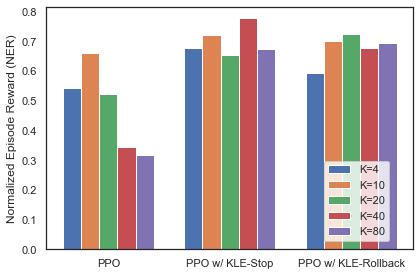

In [10]:
# Bar Plot: omparison over all environments of PPO, PPO-KLE-Rollback and PPO KLE-Stop with respect to the K hyper parameter
Ks = [4,10,20,40,80]

# Data reshape for bar plots
normrets_exp_K = []
for K in Ks:
    K_normrets = []
    for exp_idx in [0,9,4]:
        K_normrets.append(epochs_result[K][exp_idx])
    normrets_exp_K.append(K_normrets)

# Plot config
width = 0.15  # the width of the bars
labels = ['PPO', 'PPO w/ KLE-Stop', 'PPO w/ KLE-Rollback']
x = np.arange(len(labels))  # the label locations

fig, ax = plt.subplots()

rects = []
for rect_idx in range(5):
    rect = ax.bar(x - ((-rect_idx + 2) * width), normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
    rects.append(rect)

# Plot further config
ax.set_ylabel('Normalized Episode Reward (NER)')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(loc="lower right",bbox_to_anchor=(0.95, 0.01))

plt.tight_layout()
plt.show()

# Plot saving ?
# fig.savefig("./figures/NER_Avg_Over_All_Envs_By_ExpName_K.pdf")

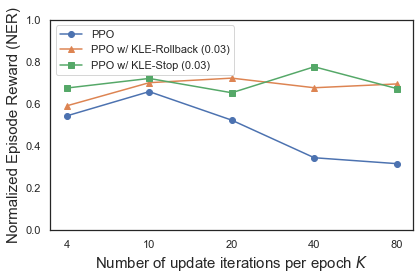

In [11]:
# Broken Line Plot: Comparison over all environments of PPO, PPO-KLE-Rollback and PPO KLE-Stop with respect to the K hyper parameter
Ks = [4,10,20,40,80]
EXP_IDXES = [0,4,9] # -> PPO, PPO KLE Rollback (0.03), PPO KLE-Stop (0.03)

# Defines the index in the `epoch_result` object to look the experiment data
exp_idx_labels = {
    0: "PPO",
    9: "PPO w/ KLE-Stop (0.03)",
    4: "PPO w/ KLE-Rollback (0.03)",
}

exp_idx_markers = {
    0: "o",
    9: "s",
    4: "^",
}

fig, ax = plt.subplots()

# Initial plot config
x = np.arange(len(Ks)) # Label locations

for exp_idx in EXP_IDXES:
    ax.plot(x, [epochs_result[K][exp_idx] for K in Ks],
        label=exp_idx_labels[exp_idx],
        marker=exp_idx_markers[exp_idx]
    )

# Plot config
ax.set_ylabel('Normalized Episode Reward (NER)', {"size": 15})
ax.set_xticks(x)
ax.set_xticklabels(Ks)
ax.set_xlabel("Number of update iterations per epoch $K$", {"size": 15})
ax.set_ylim([0,1.0])
ax.legend()

plt.tight_layout()
plt.show()

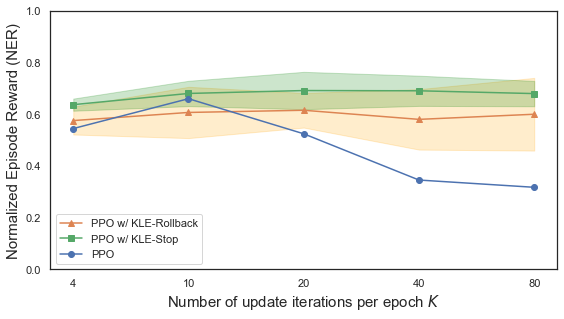

In [12]:
# Broken Line Plot: Sensitivity of KLE variants to their hyper parameter d_target
Ks = [4,10,20,40,80]
EXP_IDXES = [0,4,9] # -> PPO, PPO KLE Rollback (0.03), PPO KLE-Stop (0.03)

# Defines the index in the `epoch_result` object to look the experiment data
exp_idx_labels = {
    0: "PPO",
    9: "PPO w/ KLE-Stop",
    4: "PPO w/ KLE-Rollback",
}

exp_idx_markers = {
    0: "o",
    9: "s",
    4: "^",
}

fig, ax = plt.subplots(figsize=(8,4.6))

# Initial plot config
x = np.arange(len(Ks)) # Label locations

## Plotting the PPO line, no variance
ax.errorbar(x, [epochs_result[K][0] for K in Ks],
    label=exp_idx_labels[0],
    marker=exp_idx_markers[0]
)

## KLE Rollback plotting
kle_rollback_mean_per_K = np.mean(epochs_result[:][0:6])
kle_rollback_std_per_K = np.std(epochs_result[:][0:6])

ax.plot(x, kle_rollback_mean_per_K,
    label=exp_idx_labels[4],
    marker=exp_idx_markers[4]
)
# Add shade for PPO KLE Rollback
plt.fill_between(x,[a-b for a,b in zip(kle_rollback_mean_per_K,kle_rollback_std_per_K)],
    [a+b for a,b in zip(kle_rollback_mean_per_K,kle_rollback_std_per_K)],
    alpha=0.2,color="orange")


## KLE Stop plotting
kle_stop_mean_per_K = np.mean(epochs_result[:][6:])
kle_stop_std_per_K = np.std(epochs_result[:][6:])

ax.plot(x, kle_stop_mean_per_K,
    label=exp_idx_labels[9],
    marker=exp_idx_markers[9]
)
# Add shade for PPO KLE Rollback
plt.fill_between(x,[a-b for a,b in zip(kle_stop_mean_per_K,kle_stop_std_per_K)],
    [a+b for a,b in zip(kle_stop_mean_per_K,kle_stop_std_per_K)],
    alpha=0.2,color="green")


# Further plot config
ax.set_ylabel('Normalized Episode Reward (NER)', {"size": 15})
ax.set_xticks(x)
ax.set_xticklabels(Ks)
ax.set_xlabel("Number of update iterations per epoch $K$", {"size": 15})
ax.set_ylim([0,1.0])
ax.legend(loc="lower left")

plt.tight_layout()
plt.show()

# Save figure ?
fig.savefig("./figures/PPO_KLE_Sensitivity_d_target.pdf")

# Info: Currently working on env: Ant-v2 (1/11)
# Info: Currently working on env: HalfCheetah-v2 (2/11)
# Info: Currently working on env: Hopper-v2 (3/11)
# Info: Currently working on env: Humanoid-v2 (4/11)
# Info: Currently working on env: InvertedPendulum-v2 (5/11)
# Info: Currently working on env: Pusher-v2 (6/11)
# Info: Currently working on env: Reacher-v2 (7/11)
# Info: Currently working on env: Striker-v2 (8/11)
# Info: Currently working on env: Swimmer-v2 (9/11)
# Info: Currently working on env: Thrower-v2 (10/11)
# Info: Currently working on env: Walker2d-v2 (11/11)


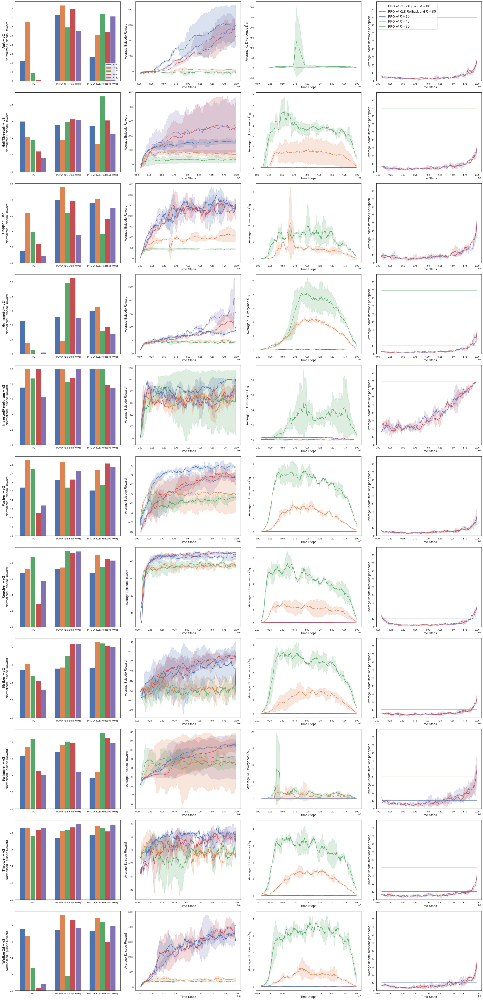

In [13]:
### All in one plots, for all environments ###

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"]
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

# Semi-dynamic plot config
N_ENVS = len(ALL_ENVS) # N_ROWS basically
N_COLS = 4

fig, axes = plt.subplots(N_ENVS,N_COLS,figsize=(N_COLS*8,N_ENVS * 6))

for ENV_IDX, env_name in enumerate(ALL_ENVS):
    print( "# Info: Currently working on env: %s (%d/%d)" % (env_name, ENV_IDX+1, len(ALL_ENVS)))
    env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
    env_approx_kl_data = ALL_ENV_APPROX_KL_DATA[env_name]
    env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]
    
    
    ############################ BAR PLOTS #################################################
    # Get current env's data
    env_exp_K_resuls = ALL_ENVS_EXP_K_RESULTS[env_name]
    
    # The index corresponds to that in the DF containing all the experiments
    exp_idx_to_labels = {
        0: "PPO",
        9: "PPO w/ KLE-Stop (0.03)",
        4: "PPO w/ KLE-Rollback (0.03)"
    }
    
    Ks = [4,10,20,40,80]
    normrets_exp_K = []
    
    # Reshape the data a bit for plotting
    for K in Ks:
        K_normrets = []
        for exp_idx, _ in exp_idx_to_labels.items():
            K_normrets.append(env_exp_K_resuls[K][exp_idx])
        
        normrets_exp_K.append(K_normrets)
    
    x = np.arange(len(exp_idx_to_labels.items()))  # the label locations
    width = 0.15  # the width of the bars
    
    # The actuall rectangles that shall be plotted
    rects = []
    for rect_idx in range(len(Ks)):
        rect = axes[ENV_IDX,0].bar(x - ((-rect_idx + 2) * width), normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
        rects.append(rect)
    
    # Add some text for labels, title and custom x-axis tick labels, etc.
    axes[ENV_IDX,0].set_ylabel(r'$\bf{{{%s}}}$'%env_name + '\nNormalized Episode Reward', {"size": 15})
    axes[ENV_IDX,0].set_xticks(x)
    
    labels = ['PPO', 'PPO w/ KLE-Stop (0.03)', 'PPO w/ KLE-Rollback (0.03)']
    axes[ENV_IDX,0].set_xticklabels(labels, {"size": 11.5})
    
    if ENV_IDX == 0:
        axes[ENV_IDX,0].legend(loc="lower right")
    ############################ END BAR PLOTS #######################################################
    
    ############################ Ep REWARD PLOTS #####################################################
    sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
        x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
        ax=axes[ENV_IDX,1])
    axes[ENV_IDX,1].set_xlabel('Time Steps', {"size": 15})
    axes[ENV_IDX,1].set_ylabel('Average Episode Reward', {"size": 15})
    axes[ENV_IDX,1].ticklabel_format(style='sci', scilimits=(0,0), axis='x')
    
    axes[ENV_IDX,1].legend_.remove()
    ############################ End Ep REWARD PLOTS ################################################
    
    ############################ PG Approx KL PLOTS #################################################
    sns.lineplot(data=env_approx_kl_data.loc[env_approx_kl_data['algo'].isin(exp_names)],
        x="global_step", y="losses/approx_kl", hue="algo", ci='sd', palette=current_palette_dict,
        ax=axes[ENV_IDX,2])
    axes[ENV_IDX,2].set_xlabel('Time Steps', {"size": 15})
    axes[ENV_IDX,2].set_ylabel('Average KL Divergence $\\bar{D}_{\\mathrm{KL}}$', {"size": 15})
    handles, labels = axes[ENV_IDX][1].get_legend_handles_labels()
    leg = axes[ENV_IDX,2].legend(handles=handles[1:], labels=labels[1:], loc='upper left')
    for text in leg.get_texts():
        text.set_text(exp_convert_dict[text.get_text()])
    axes[ENV_IDX,2].ticklabel_format(style='sci', scilimits=(0,0), axis='x')
    
    #     axes[ENV_IDX,2].set_title(env_name)
    # Remove the legend by default, since it is shared by all plots.
    axes[ENV_IDX,2].legend_.remove()
    ############################ End Approx KL PLOTS ################################################
    
    ############################ PG Stop Iter PLOTS #################################################
    
    axes[ENV_IDX,3].set_ylim(0, 100)
    axes[ENV_IDX,3].set_yticks([ i for i in range(0,100,10)])
    sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
        x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
        ax=axes[ENV_IDX,3])
    axes[ENV_IDX,3].set_xlabel('Time Steps', {"size": 15})
    axes[ENV_IDX,3].set_ylabel('Average update iterations per epoch', {"size": 15})
    axes[ENV_IDX,3].ticklabel_format(style='sci', scilimits=(0,0), axis='x')
    
    # Legends only on the first env's plot
    if ENV_IDX == 0:
        handles, labels = axes[ENV_IDX][3].get_legend_handles_labels()
        leg = axes[ENV_IDX,3].legend(handles=handles[1:], labels=labels[1:], loc='upper left',prop={'size': 15})
        for text in leg.get_texts():
            text.set_text(exp_convert_dict[text.get_text()])
    else:
        
        # Remove the legend by default, since it is shared by all plots.
        axes[ENV_IDX,3].legend_.remove()

    ############################ End PG Stop Iter PLOTS #############################################

plt.tight_layout()
plt.show()

# fig.savefig("./figures/AllIn1Plot.pdf")

# Info: Currently generating env: Ant-v2 (1/11)
# Info: Currently generating env: HalfCheetah-v2 (2/11)
# Info: Currently generating env: Hopper-v2 (3/11)
# Info: Currently generating env: Humanoid-v2 (4/11)
# Info: Currently generating env: InvertedPendulum-v2 (5/11)
# Info: Currently generating env: Pusher-v2 (6/11)
# Info: Currently generating env: Reacher-v2 (7/11)
# Info: Currently generating env: Striker-v2 (8/11)
# Info: Currently generating env: Swimmer-v2 (9/11)
# Info: Currently generating env: Thrower-v2 (10/11)
# Info: Currently generating env: Walker2d-v2 (11/11)


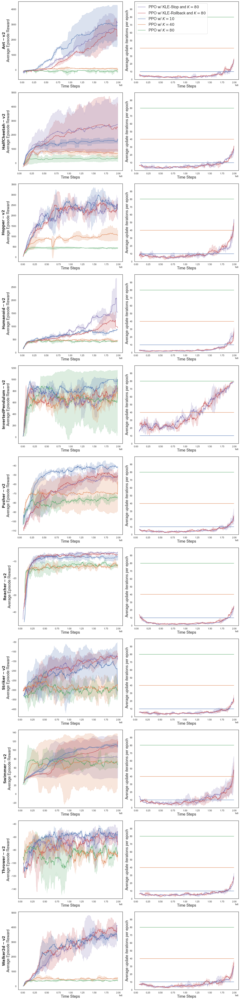

In [14]:
### Avg Ep Reward and Pg Stop iter on all envs ###

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"]
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

# Semi-dynamic plot config
N_ENVS = len(ALL_ENVS) # N_ROWS basically
N_COLS = 2

fig, axes = plt.subplots(N_ENVS,N_COLS,figsize=(N_COLS*8,N_ENVS * 6))

for ENV_IDX, env_name in enumerate(ALL_ENVS):
    print( "# Info: Currently generating env: %s (%d/%d)" % (env_name, ENV_IDX+1, len(ALL_ENVS)))
    env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
    env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]
    
    ############################ Ep REWARD PLOTS #####################################################
    sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
        x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
        ax=axes[ENV_IDX,0])
    axes[ENV_IDX,0].set_xlabel('Time Steps', {"size": 18})
    axes[ENV_IDX,0].set_ylabel(r'$\bf{{{%s}}}$'%env_name + '\nAverage Episode Reward',
        {"size": 18})
    axes[ENV_IDX,0].ticklabel_format(style='sci', scilimits=(0,0), axis='x')
    
    axes[ENV_IDX,0].legend_.remove()
    ############################ End Ep REWARD PLOTS ################################################
    
    ############################ PG Stop Iter PLOTS #################################################
    
    axes[ENV_IDX,1].set_ylim(0, 100)
    axes[ENV_IDX,1].set_yticks([ i for i in range(0,100,10)])
    sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
        x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
        ax=axes[ENV_IDX,1])
    axes[ENV_IDX,1].set_xlabel('Time Steps', {"size": 18})
    axes[ENV_IDX,1].set_ylabel('Average update iterations per epoch', {"size": 18})
    axes[ENV_IDX,1].ticklabel_format(style='sci', scilimits=(0,0), axis='x')
    
    # Legends only on the first env's plot
    if ENV_IDX == 0:
        handles, labels = axes[ENV_IDX][1].get_legend_handles_labels()
        leg = axes[ENV_IDX,1].legend(handles=handles[1:], labels=labels[1:], loc='upper left',prop={'size': 18})
        for text in leg.get_texts():
            text.set_text(exp_convert_dict[text.get_text()])
    else:
        
        # Remove the legend by default, since it is shared by all plots.
        axes[ENV_IDX,1].legend_.remove()

    ############################ End PG Stop Iter PLOTS #############################################

plt.tight_layout()
plt.show()

# Get the human lisible date at gen. time
fig.savefig("./figures/AllEnvsEpRewardAndPgStopIter.pdf")

# Info: Currently generating env: HalfCheetah-v2


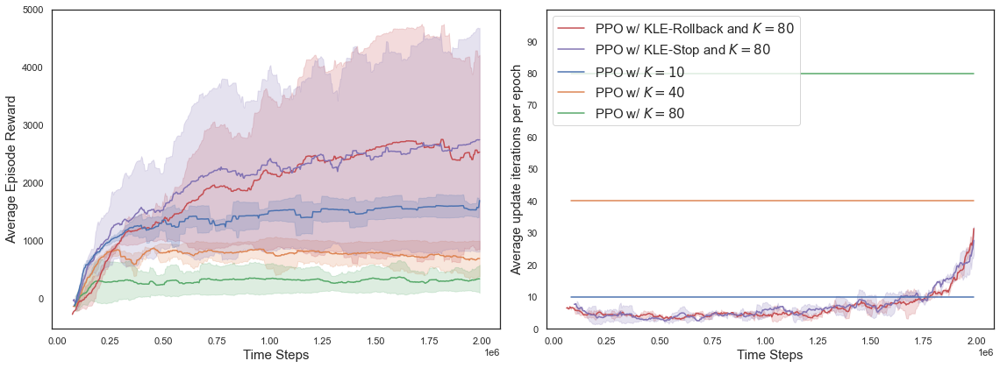

In [15]:
### Avg Ep Reward and Pg Stop iter for a single ENV ###

##### IMPORTANT #####
# Always set the env name here
env_name = "HalfCheetah-v2"

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"]
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

fig, axes = plt.subplots(1,2,figsize=(2*8,1 * 6))

print( "# Info: Currently generating env: %s" % (env_name))
env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]
    
############################ Ep REWARD PLOTS #####################################################
sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
    x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
    ax=axes[0])
axes[0].set_xlabel('Time Steps', {"size": 15})
axes[0].set_ylabel('Average Episode Reward', {"size": 15})
axes[0].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

axes[0].legend_.remove()
############################ End Ep REWARD PLOTS ################################################
    
############################ PG Stop Iter PLOTS #################################################

axes[1].set_ylim(0, 100)
axes[1].set_yticks([ i for i in range(0,100,10)])
sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
    x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
    ax=axes[1])
axes[1].set_xlabel('Time Steps', {"size": 15})
axes[1].set_ylabel('Average update iterations per epoch', {"size": 15})
axes[1].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

# Legends only on the first env's plot
handles, labels = axes[1].get_legend_handles_labels()
leg = axes[1].legend(handles=handles[1:], labels=labels[1:], loc='upper left',prop={'size': 15})
for text in leg.get_texts():
    text.set_text(exp_convert_dict[text.get_text()])

############################ End PG Stop Iter PLOTS  ############################################

plt.tight_layout()
plt.show()

# Get the human lisible date at gen. time
fig.savefig("./figures/%s_EpRewardAndPgStopIter.pdf" % env_name)

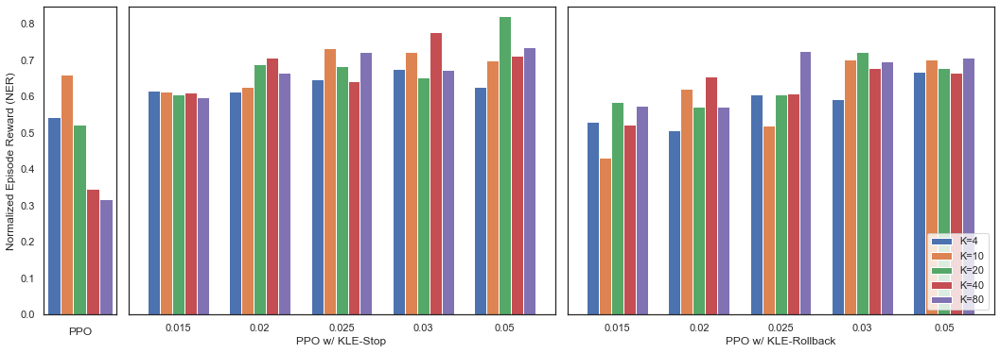

In [16]:
# PPO and KLE-variants across vales of d_target

Ks = [4,10,20,40,80]
all_exp_normrets_exp_K = []

# Reshape the data a bit for plotting
for K in Ks:
    K_normrets = []
    for exp_idx in range(len(ALL_EXP_NAMES)):
        K_normrets.append(epochs_result[K][exp_idx])
    all_exp_normrets_exp_K.append(K_normrets)
    
# Lazy conver to np array for slicing
all_exp_normrets_exp_K = np.array(all_exp_normrets_exp_K)

width = 0.15  # the width of the bars

fig, axes = plt.subplots(1,3, figsize=(18,6),
    gridspec_kw = {'width_ratios':[.78, 4.61,4.61], 'wspace': 0.04, "hspace": 0.04})

for axe in axes:
    axe.set_ylim(0,all_exp_normrets_exp_K.max()+0.025)

### Standard PPO plot
x = np.arange(1)
normrets_exp_K = all_exp_normrets_exp_K[:,0] # Note: Manual indexation
rects = []
for rect_idx in range(5):
    rect = axes[0].bar(x - ((-rect_idx + 2) * width),
                  normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
    rects.append(rect)

# Add some text for labels, title and custom x-axis tick labels, etc.
axes[0].set_ylabel('Normalized Episode Reward (NER)')
axes[0].set_xticklabels([])
axes[0].set_xlabel("PPO")

### KLE-Stop ###
x = np.arange(5)
normrets_exp_K = all_exp_normrets_exp_K[:,6:] # Note: Manual indexation
rects = []
for rect_idx in range(5):
    rect = axes[1].bar(x - ((-rect_idx + 2) * width),
                  normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
    rects.append(rect)
    
axes[1].set_xticks(x)
exp_labels = [ '0.015', '0.02', '0.025', '0.03', '0.05']
axes[1].set_xticklabels(exp_labels)
axes[1].set_xlabel("PPO w/ KLE-Stop")
axes[1].set_yticklabels([])

### KLE-Rollback ###
exp_labels = [ '', '0.015', '0.02', '0.025', '0.03', '0.05'] # Why the weird shift though ?
normrets_exp_K = all_exp_normrets_exp_K[:,1:6] # Note: Manual indexation
rects = []
for rect_idx in range(5):
    rect = axes[2].bar(x - ((-rect_idx + 2) * width),
                  normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
    rects.append(rect)
axes[2].set_xticklabels(exp_labels)
axes[2].set_xlabel("PPO w/ KLE-Rollback")
axes[2].set_yticklabels([])
axes[2].legend(loc="lower right")

# plt.tight_layout()
plt.show()

# Get the human lisible date at gen. time
fig.savefig("./figures/PPO_And_KLE_Variants_Across_d_target.pdf")

# Info: Currently working on env: Ant-v2
# Info: Currently working on env: HalfCheetah-v2
# Info: Currently working on env: Hopper-v2


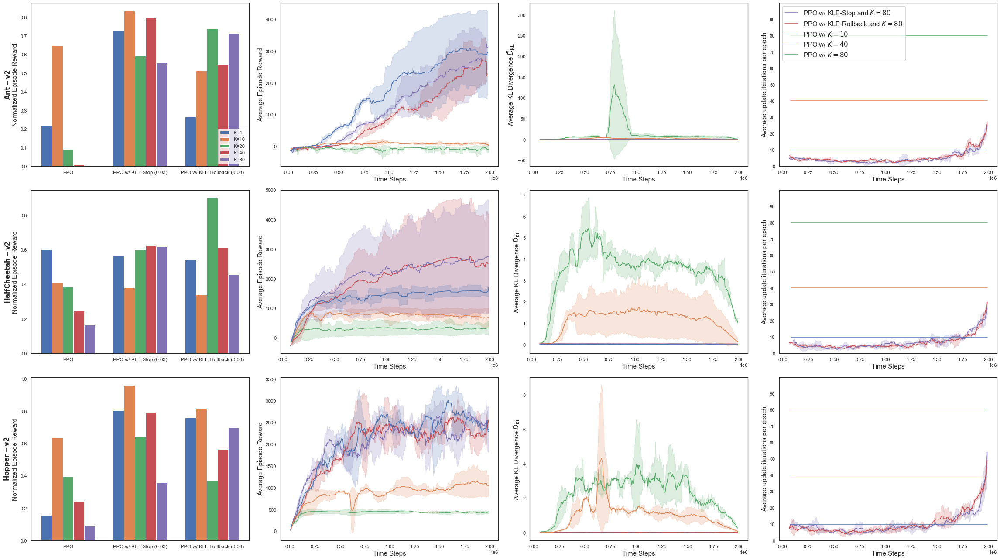

# Info: Currently working on env: Humanoid-v2
# Info: Currently working on env: InvertedPendulum-v2
# Info: Currently working on env: Pusher-v2


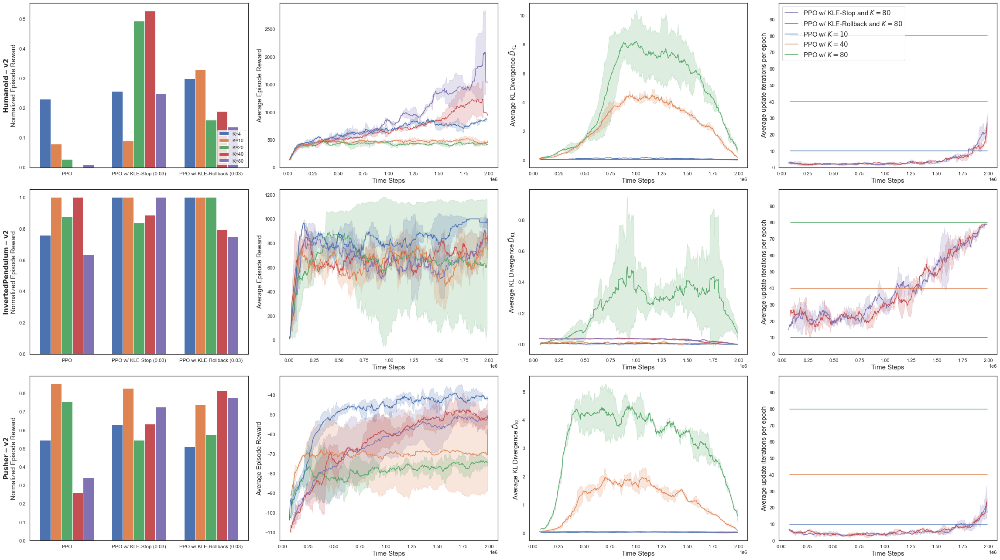

# Info: Currently working on env: Reacher-v2
# Info: Currently working on env: Striker-v2
# Info: Currently working on env: Swimmer-v2


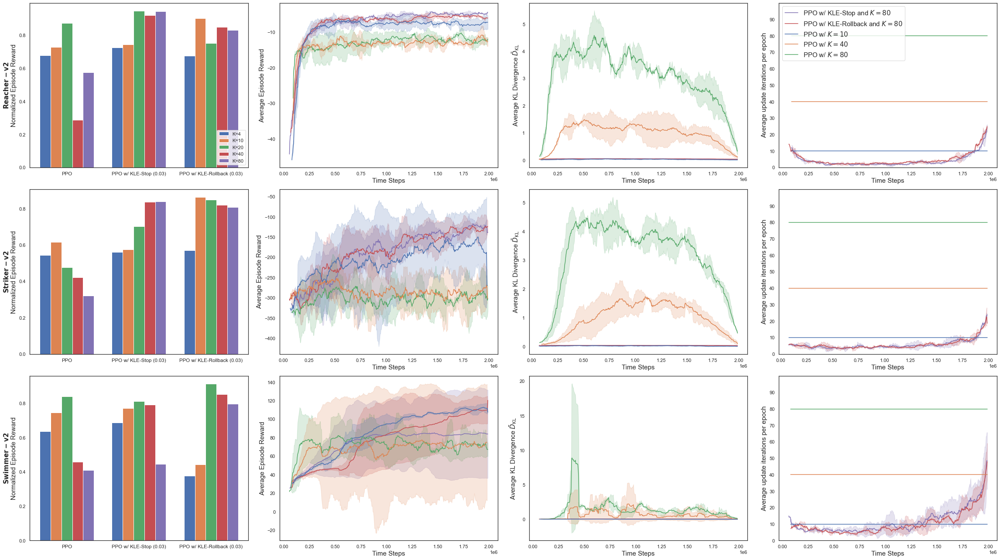

# Info: Currently working on env: Thrower-v2
# Info: Currently working on env: Walker2d-v2


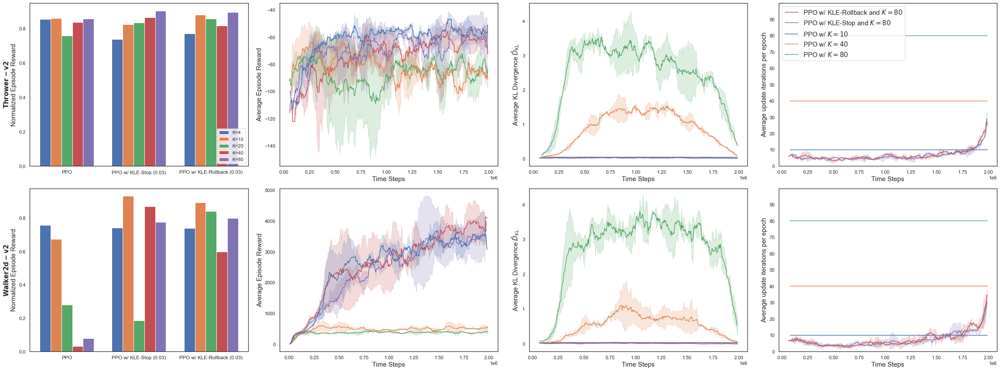

In [17]:
### Generate plots in multiple partitions: One env per line

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"] 
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

# Semi-dynamic plot config
N_ENVS = len(ALL_ENVS) # N_ROWS basically
N_COLS = 4

NUM_ENVS_PERT_PARTITION = 3
NUM_PART = math.ceil( N_ENVS / NUM_ENVS_PERT_PARTITION)

for part in range(NUM_PART):
    part_first_env_idx = part * NUM_ENVS_PERT_PARTITION
    part_last_env_idx = part_first_env_idx + NUM_ENVS_PERT_PARTITION
    
    # Adjust number of col (envs) per partition in case it does not match N_ENVS // NUM_ENVS_PERT_PARTITION exactly
    part_row_number = NUM_ENVS_PERT_PARTITION if part != NUM_PART-1 else N_ENVS % NUM_ENVS_PERT_PARTITION
    fig, axes = plt.subplots(part_row_number,N_COLS,figsize=(N_COLS * 8,part_row_number*6))
    
    for row_idx, env_name in enumerate(ALL_ENVS[part_first_env_idx:part_last_env_idx]):
        print( "# Info: Currently working on env: %s" % (env_name))
        env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
        env_approx_kl_data = ALL_ENV_APPROX_KL_DATA[env_name]
        env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]

        ############################ BAR PLOTS #################################################
        # Get current envs data
        env_exp_K_resuls = ALL_ENVS_EXP_K_RESULTS[env_name]

        # The index corresponds to that in the DF containing all the experiments
        exp_idx_to_labels = {
            0: "PPO",
            9: "PPO w/ KLE-Stop (0.03)",
            4: "PPO w/ KLE-Rollback (0.03)"
        }


        Ks = [4,10,20,40,80]
        normrets_exp_K = []

        # Reshape the data a bit for plotting
        for K in Ks:
            K_normrets = []
            for exp_idx, _ in exp_idx_to_labels.items():
                K_normrets.append(env_exp_K_resuls[K][exp_idx])

            normrets_exp_K.append(K_normrets)

        x = np.arange(len(exp_idx_to_labels.items()))  # the label locations
        width = 0.15  # the width of the bars

        # The actuall rectangles that shall be plotted
        rects = []
        for rect_idx in range(len(Ks)):
            rect = axes[row_idx,0].bar(x - ((-rect_idx + 2) * width), normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
            rects.append(rect)

        # Add some text for labels, title and custom x-axis tick labels, etc.
        axes[row_idx,0].set_ylabel(r'$\bf{{{%s}}}$'%env_name + '\nNormalized Episode Reward', {"size": 15})
        axes[row_idx,0].set_xticks(x)

        labels = ['PPO', 'PPO w/ KLE-Stop (0.03)', 'PPO w/ KLE-Rollback (0.03)']
        axes[row_idx,0].set_xticklabels(labels, {"size": 11.5})

        if row_idx == 0:
            axes[row_idx,0].legend(loc="lower right")
        ############################ END BAR PLOTS #######################################################

        ############################ Ep REWARD PLOTS #####################################################
        sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
            x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[row_idx,1])
        axes[row_idx,1].set_xlabel('Time Steps', {"size": 15})
        axes[row_idx,1].set_ylabel('Average Episode Reward', {"size": 15})
        axes[row_idx,1].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        axes[row_idx,1].legend_.remove()
        ############################ End Ep REWARD PLOTS ################################################

        ############################ PG Approx KL PLOTS #################################################
        sns.lineplot(data=env_approx_kl_data.loc[env_approx_kl_data['algo'].isin(exp_names)],
            x="global_step", y="losses/approx_kl", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[row_idx,2])
        axes[row_idx,2].set_xlabel('Time Steps', {"size": 15})
        axes[row_idx,2].set_ylabel('Average KL Divergence $\\bar{D}_{\\mathrm{KL}}$', {"size": 15})
        handles, labels = axes[row_idx][1].get_legend_handles_labels()
        leg = axes[row_idx,2].legend(handles=handles[1:], labels=labels[1:], loc='upper left')
        for text in leg.get_texts():
            text.set_text(exp_convert_dict[text.get_text()])
        axes[row_idx,2].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        # Remove the legend by default, since it is shared by all plots.
        axes[row_idx,2].legend_.remove()
        ############################ End Approx KL PLOTS ################################################

        ############################ PG Stop Iter PLOTS #################################################

        axes[row_idx,3].set_ylim(0, 100)
        axes[row_idx,3].set_yticks([ i for i in range(0,100,10)])
        sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
            x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[row_idx,3])
        axes[row_idx,3].set_xlabel('Time Steps', {"size": 15})
        axes[row_idx,3].set_ylabel('Average update iterations per epoch', {"size": 15})
        axes[row_idx,3].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        # Legends only on the first env's plot
        if row_idx == 0:
            handles, labels = axes[row_idx][3].get_legend_handles_labels()
            leg = axes[row_idx,3].legend(handles=handles[1:], labels=labels[1:], loc='upper left',prop={'size': 15})
            for text in leg.get_texts():
                text.set_text(exp_convert_dict[text.get_text()])
        else:

            # Remove the legend by default, since it is shared by all plots.
            axes[row_idx,3].legend_.remove()

        ############################ End PG Stop Iter PLOTS ############################################

    plt.tight_layout()
    plt.show()

    # Get the human lisible date at gen. time
    fig.savefig("./figures/AllInOnePlotHorizontal_Part%d.pdf" % part)

# Info: Currently working on env: Ant-v2
# Info: Currently working on env: HalfCheetah-v2
# Info: Currently working on env: Hopper-v2


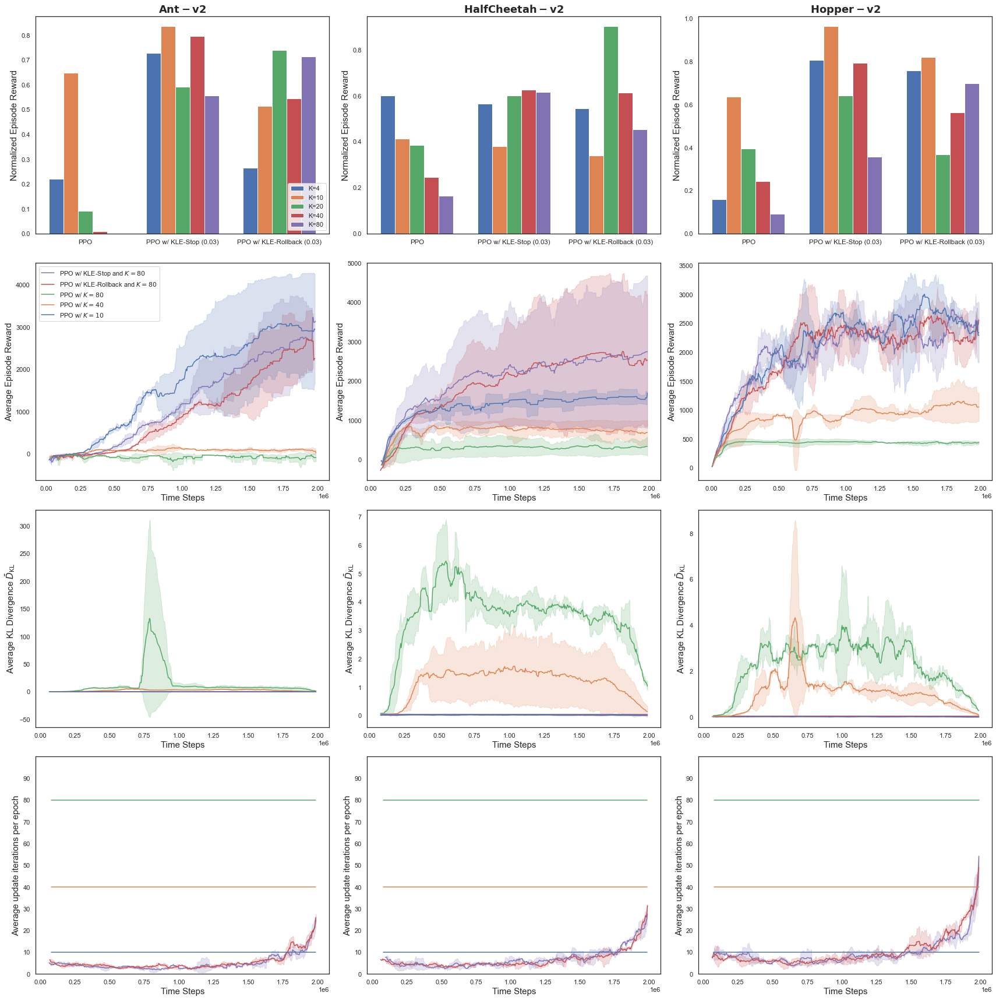

# Info: Currently working on env: Humanoid-v2
# Info: Currently working on env: InvertedPendulum-v2
# Info: Currently working on env: Pusher-v2


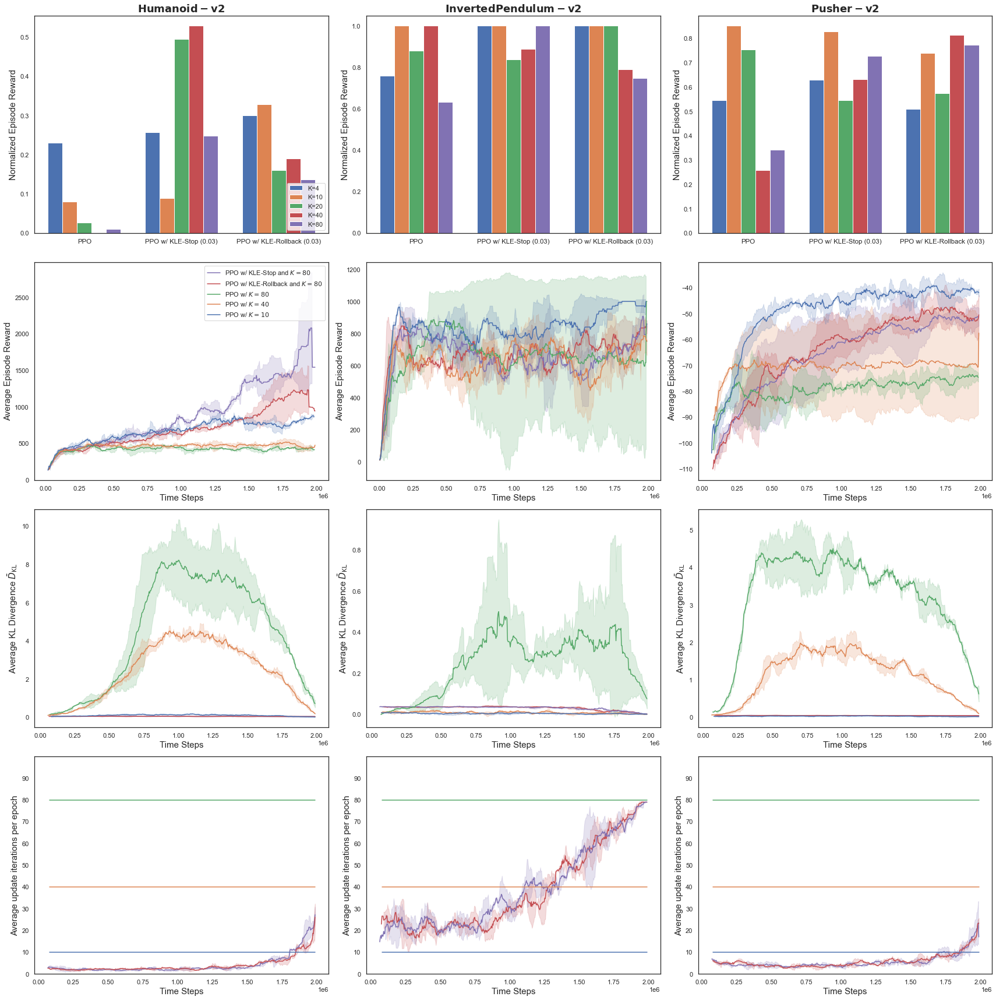

# Info: Currently working on env: Reacher-v2
# Info: Currently working on env: Striker-v2
# Info: Currently working on env: Swimmer-v2


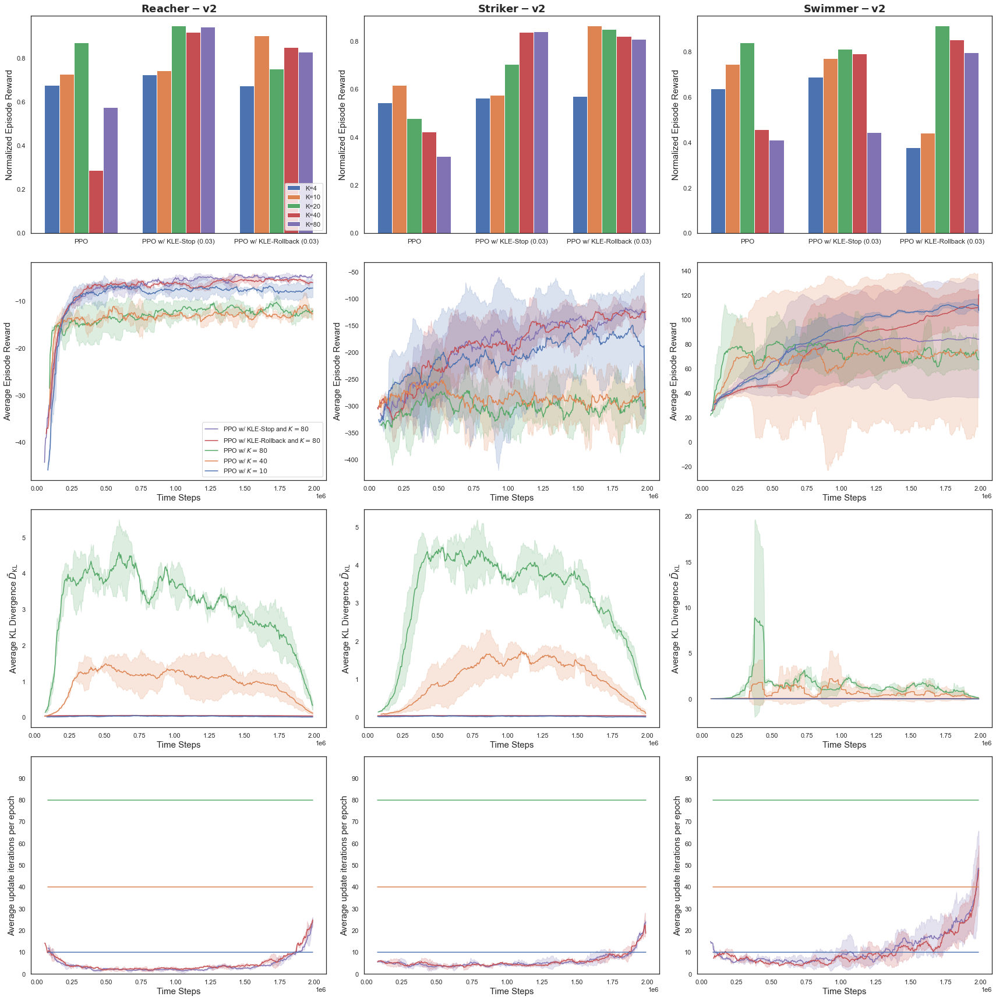

# Info: Currently working on env: Thrower-v2
# Info: Currently working on env: Walker2d-v2


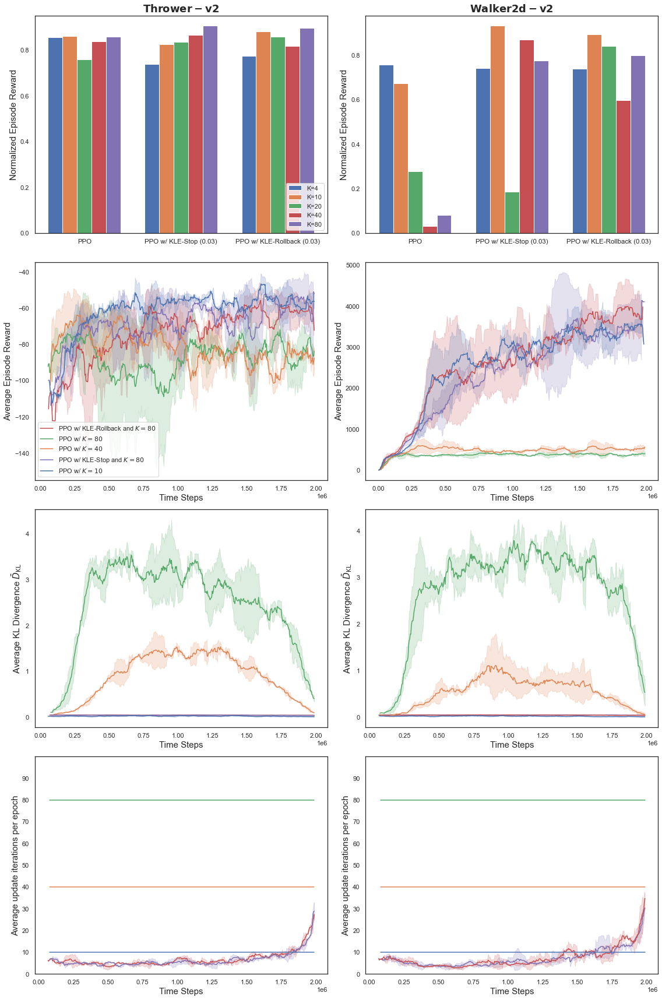

In [18]:
### Generate plots in multiple partitions: One env per line

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"] 
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

# Semi-dynamic plot config
N_ENVS = len(ALL_ENVS) # N_ROWS basically
N_ROWS = 4

NUM_ENVS_PERT_PARTITION = 3
NUM_PART = math.ceil( N_ENVS / NUM_ENVS_PERT_PARTITION)

for part in range(NUM_PART):
    part_first_env_idx = part * NUM_ENVS_PERT_PARTITION
    part_last_env_idx = part_first_env_idx + NUM_ENVS_PERT_PARTITION
    
    # Adjust number of col (envs) per partition in case it does not match N_ENVS // NUM_ENVS_PERT_PARTITION exactly
    part_col_number = NUM_ENVS_PERT_PARTITION if part != NUM_PART-1 else N_ENVS % NUM_ENVS_PERT_PARTITION
    fig, axes = plt.subplots(N_ROWS,part_col_number,figsize=(part_col_number * 8,N_ROWS*6))
    
    for col_idx, env_name in enumerate(ALL_ENVS[part_first_env_idx:part_last_env_idx]):
        print( "# Info: Currently working on env: %s" % (env_name))
        env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
        env_approx_kl_data = ALL_ENV_APPROX_KL_DATA[env_name]
        env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]

        ############################ BAR PLOTS #################################################
        # Get current envs data
        env_exp_K_resuls = ALL_ENVS_EXP_K_RESULTS[env_name]

        # The index corresponds to that in the DF containing all the experiments
        exp_idx_to_labels = {
            0: "PPO",
            9: "PPO w/ KLE-Stop (0.03)",
            4: "PPO w/ KLE-Rollback (0.03)"
        }

        Ks = [4,10,20,40,80]
        normrets_exp_K = []

        # Reshape the data a bit for plotting
        for K in Ks:
            K_normrets = []
            for exp_idx, _ in exp_idx_to_labels.items():
                K_normrets.append(env_exp_K_resuls[K][exp_idx])

            normrets_exp_K.append(K_normrets)

        x = np.arange(len(exp_idx_to_labels.items()))  # the label locations
        width = 0.15  # the width of the bars

        # The actuall rectangles that shall be plotted
        rects = []
        for rect_idx in range(len(Ks)):
            rect = axes[0,col_idx].bar(x - ((-rect_idx + 2) * width), normrets_exp_K[rect_idx], width, label='K=%d'%Ks[rect_idx])
            rects.append(rect)

        # Add some text for labels, title and custom x-axis tick labels, etc.
        axes[0,col_idx].set_ylabel('Normalized Episode Reward', {"size": 15})
        axes[0,col_idx].set_xticks(x)
        axes[0,col_idx].set_title(r'$\bf{{{%s}}}$'%env_name, {"size": 18})

        labels = ['PPO', 'PPO w/ KLE-Stop (0.03)', 'PPO w/ KLE-Rollback (0.03)']
        axes[0,col_idx].set_xticklabels(labels, {"size": 11.5})

        if col_idx == 0:
            axes[0,col_idx].legend(loc="lower right")
        ############################ END BAR PLOTS #######################################################

        ############################ Ep REWARD PLOTS #####################################################
        sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
            x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[1,col_idx])
        axes[1,col_idx].set_xlabel('Time Steps', {"size": 15})
        axes[1,col_idx].set_ylabel('Average Episode Reward', {"size": 15})
        axes[1,col_idx].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        
        # Legend on the second line Ep Reward only
        if col_idx == 0:
            handles, labels = axes[1,col_idx].get_legend_handles_labels()
            leg = axes[1,col_idx].legend(handles=handles[1:], labels=labels[1:], loc='best')
            for text in leg.get_texts():
                text.set_text(exp_convert_dict[text.get_text()])
        else:
            axes[1,col_idx].legend_.remove()
            
        ############################ End Ep REWARD PLOTS ################################################

        ############################ PG Approx KL PLOTS #################################################
        sns.lineplot(data=env_approx_kl_data.loc[env_approx_kl_data['algo'].isin(exp_names)],
            x="global_step", y="losses/approx_kl", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[2,col_idx])
        axes[2,col_idx].set_xlabel('Time Steps', {"size": 15})
        axes[2,col_idx].set_ylabel('Average KL Divergence $\\bar{D}_{\\mathrm{KL}}$', {"size": 15})
        axes[2,col_idx].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        axes[2,col_idx].legend_.remove()
        ############################ End Approx KL PLOTS ################################################

        ############################ PG Stop Iter PLOTS #################################################
        axes[3,col_idx].set_ylim(0, 100)
        axes[3,col_idx].set_yticks([ i for i in range(0,100,10)])
        sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
            x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
            ax=axes[3,col_idx])
        axes[3,col_idx].set_xlabel('Time Steps', {"size": 15})
        axes[3,col_idx].set_ylabel('Average update iterations per epoch', {"size": 15})
        axes[3,col_idx].ticklabel_format(style='sci', scilimits=(0,0), axis='x')

        # Remove the legend by default, since it is shared by all plots.
        axes[3,col_idx].legend_.remove()

        ############################ End PG Stop Iter PLOTS ############################################

    plt.tight_layout()
    plt.show()

    # Get the human lisible date at gen. time
    fig.savefig("./figures/AllInOnePlotVertical_Part%d.pdf" % part)

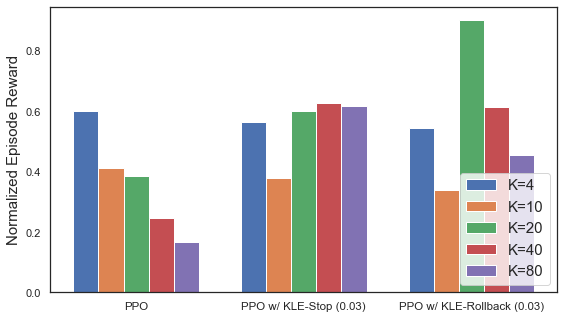

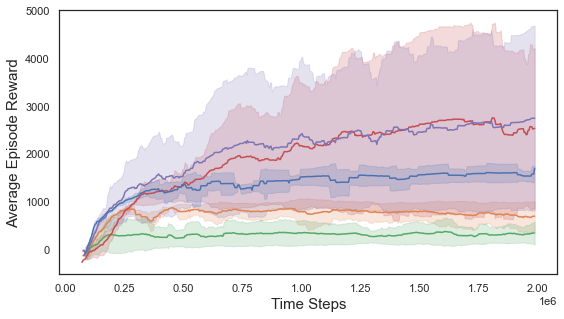

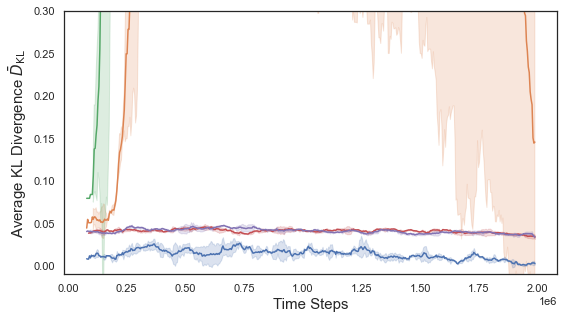

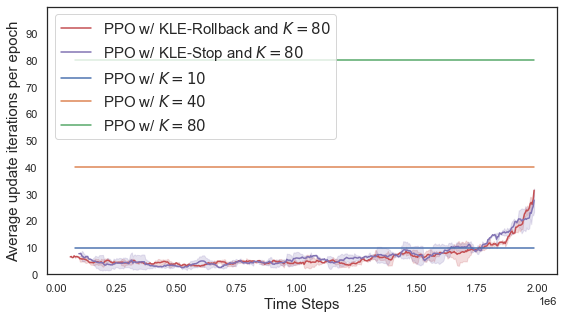

In [19]:
# Individual plots for an environment

## Config: set the environment we want the results of.
env_name = "HalfCheetah-v2"
shared_figsize = (8,4.6)

## Loads all necessary data
env_ep_reward_data = ALL_ENV_EP_REWARD_DATA[env_name]
env_approx_kl_data = ALL_ENV_APPROX_KL_DATA[env_name]
env_pgiterstop_data = ALL_ENV_PG_STOP_ITER_DATA[env_name]

### Pallettes for Ep Reward, Approx KL and PGIterStop Plots
current_palette = sns.color_palette(n_colors=8)

# Isolating the experiments we are interested in
exp_names = [
    "m-aggr-10",
    "m-aggr-40", 
    "m-aggr-80", 
    "m-aggr-kle-rollback-0.03-80", 
    "m-aggr-kle-stop-0.03-80"]

real_exp_names = [
    "PPO w/ $K=10$",
    "PPO w/ $K=40$",
    "PPO w/ $K=80$",
    "PPO w/ KLE-Rollback and $K=80$",
    "PPO w/ KLE-Stop and $K=80$"]
current_palette_dict = dict(zip(exp_names, current_palette))
exp_convert_dict = dict(zip(exp_names, real_exp_names))

############################ BAR PLOT ########################################################
fig, ax = plt.subplots(figsize=shared_figsize)

# Get current envs data
env_exp_K_resuls = ALL_ENVS_EXP_K_RESULTS[env_name]

# The index corresponds to that in the DF containing all the experiments
exp_idx_to_labels = {
    0: "PPO",
    9: "PPO w/ KLE-Stop (0.03)",
    4: "PPO w/ KLE-Rollback (0.03)"
}

Ks = [4,10,20,40,80]
normrets_exp_K = []

# Reshape the data a bit for plotting
for K in Ks:
    K_normrets = []
    for exp_idx, _ in exp_idx_to_labels.items():
        K_normrets.append(env_exp_K_resuls[K][exp_idx])

    normrets_exp_K.append(K_normrets)

x = np.arange(len(exp_idx_to_labels.items()))  # the label locations
width = 0.15  # the width of the bars

# The actuall rectangles that shall be plotted
rects = []
for rect_idx in range(len(Ks)):
    rect = ax.bar(x - ((-rect_idx + 2) * width), normrets_exp_K[rect_idx],
        width, label='K=%d'%Ks[rect_idx])
    rects.append(rect)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Normalized Episode Reward', {"size": 15})
ax.set_xticks(x)

labels = ['PPO', 'PPO w/ KLE-Stop (0.03)', 'PPO w/ KLE-Rollback (0.03)']
ax.set_xticklabels(labels, {"size": 11.5})

handles, labels = ax.get_legend_handles_labels()
leg = ax.legend(handles=handles[:5], labels=labels[:5], loc='lower right', prop={"size": 15})
    
plt.tight_layout()
plt.show()

fig.savefig("./figures/%s_IndividualBarPlot.pdf" % env_name)
############################ END BAR PLOT ####################################################
        
## Episode Reward Plot
############################ Ep REWARD PLOTS #####################################################
fig, ax = plt.subplots(figsize=shared_figsize)

sns.lineplot(data=env_ep_reward_data.loc[env_ep_reward_data['algo'].isin(exp_names)],
    x="global_step", y="charts/episode_reward", hue="algo", ci='sd', palette=current_palette_dict,
    ax=ax)
ax.set_xlabel('Time Steps', {"size": 15})
ax.set_ylabel('Average Episode Reward', {"size": 15})
ax.ticklabel_format(style='sci', scilimits=(0,0), axis='x')

# Adds legend
handles, labels = ax.get_legend_handles_labels()
leg = ax.legend(handles=handles[1:], labels=labels[1:], loc='upper left', prop={"size": 15})
for text in leg.get_texts():
    text.set_text(exp_convert_dict[text.get_text()])

# Removes legend if needed
ax.legend_.remove()

plt.tight_layout()
plt.show()

fig.savefig("./figures/%s_IndividualEpisodeReward.pdf" % env_name)
############################ End Ep REWARD PLOTS ################################################

############################ PG Approx KL PLOTS #################################################
fig, ax = plt.subplots(figsize=shared_figsize)
ax.set_ylim(-.01,.3)
sns.lineplot(data=env_approx_kl_data.loc[env_approx_kl_data['algo'].isin(exp_names)],
    x="global_step", y="losses/approx_kl", hue="algo", ci='sd', palette=current_palette_dict,
    ax=ax)
ax.set_xlabel('Time Steps', {"size": 15})
ax.set_ylabel('Average KL Divergence $\\bar{D}_{\\mathrm{KL}}$', {"size": 15})
ax.ticklabel_format(style='sci', scilimits=(0,0), axis='x')

# Removed the legend
ax.legend_.remove()

plt.tight_layout()
plt.show()

fig.savefig("./figures/%s_IndividualApproxKL.pdf" % env_name)
############################ End Approx KL PLOTS ################################################

############################ PG Stop Iter PLOTS #################################################
fig, ax = plt.subplots(figsize=shared_figsize)

ax.set_ylim(0, 100)
ax.set_yticks([ i for i in range(0,100,10)])
sns.lineplot(data=env_pgiterstop_data.loc[env_pgiterstop_data['algo'].isin(exp_names)],
    x="global_step", y="debug/pg_stop_iter", hue="algo", ci='sd', palette=current_palette_dict,
    ax=ax)
ax.set_xlabel('Time Steps', {"size": 15})
ax.set_ylabel('Average update iterations per epoch', {"size": 15})
ax.ticklabel_format(style='sci', scilimits=(0,0), axis='x')

# Adds legend
handles, labels = ax.get_legend_handles_labels()
leg = ax.legend(handles=handles[1:], labels=labels[1:], loc='upper left', prop={"size": 15})
for text in leg.get_texts():
    text.set_text(exp_convert_dict[text.get_text()])

# Removed the legend
# ax.legend_.remove()

plt.tight_layout()
plt.show()

fig.savefig("./figures/%s_IndividualPgStopIter.pdf" % env_name)
############################ End PG Stop Iter PLOTS #############################################